In [1]:
import torch
from torch import nn
from torch.nn import functional as F
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from tqdm.notebook import tqdm

from sklearn.manifold import TSNE

### Data

In [3]:
from torchvision.datasets import MNIST
from torchvision import transforms

from torch.utils.data import DataLoader

mnist_transforms = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
batch_size = 64


In [4]:
train_dataset = MNIST('./mnist_root', train=True, transform=mnist_transforms, download=True)
test_dataset = MNIST('./mnist_root', train=False, transform=mnist_transforms, download=True)

train_loader = DataLoader(train_dataset, batch_size=batch_size, drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, drop_last=True)


### Simple AE

In [5]:
class Block(nn.Module):
    def __init__(self, in_features, out_features, kernel, stride=1, bias=False, upsample=False):
        super().__init__()
        self.upsample = upsample

        self.conv = nn.Conv2d(in_features, out_features, kernel, stride=stride, padding=(kernel-1)//2, bias=bias)
        self.norm = nn.BatchNorm2d(out_features)
        self.act = nn.LeakyReLU(0.2)
        
    def forward(self, x):
        if self.upsample:
            x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False, recompute_scale_factor=False)
        return self.act(self.norm(self.conv(x)))
        
class AutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.encoder = nn.Sequential(
            Block(1, 16, 3, stride=2),
            Block(16, 32, 3, stride=2),
            Block(32, 32, 3, stride=2),
            Block(32, 32, 3, stride=2),
            Block(32, 32, 3, stride=1).conv,
        )
        
        self.decoder = nn.Sequential(
            Block(32, 32, 3, upsample=True),
            Block(32, 32, 3, upsample=True),
            Block(32, 32, 3, upsample=True),
            Block(32, 16, 3, upsample=True),
            Block(16, 1, 3).conv,
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        x = torch.sigmoid(x)
        return x
    
    def get_latent_features(self, x):
        return self.encoder(x)

In [6]:
ae = AutoEncoder().to(device)
optim = torch.optim.Adam(ae.parameters(), lr=0.001)
criterion = nn.MSELoss()

Чтобы проверить осмысленность latent-space репрезентаций, построим простую кластеризацию до и после обучения

In [7]:
tsne = TSNE()
ae.eval()

latent_mnist = [
    ae.get_latent_features(x.to(device)).detach().to('cpu').view(batch_size, -1) for x, _ in tqdm(test_loader)
]
latent_mnist = torch.cat(latent_mnist, dim=0).numpy()

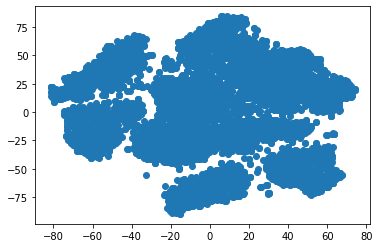

CPU times: user 3min 27s, sys: 217 ms, total: 3min 27s
Wall time: 3min 27s


In [8]:
%%time

tsne_mnist = tsne.fit_transform(latent_mnist)
plt.scatter(tsne_mnist[:, 0], tsne_mnist[:, 1])
plt.show()

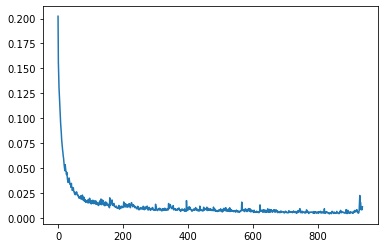

In [9]:
losses = []
ae.train()

for image, _ in tqdm(train_loader, desc='train loop', leave=True):
    optim.zero_grad()
    image = image.to(device)
    out = ae(image)
    loss = criterion(out, image)
    loss.backward()
    optim.step()
    losses.append(loss.item())
plt.plot(losses)
plt.show()

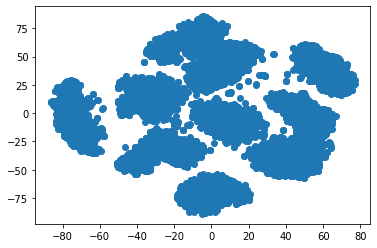

In [10]:
tsne = TSNE()
ae.eval()


latent_mnist = [
    ae.get_latent_features(x.to(device)).detach().to('cpu').view(batch_size, -1) for x, _ in tqdm(test_loader)
]
latent_mnist = torch.cat(latent_mnist, dim=0).numpy()
tsne_mnist = tsne.fit_transform(latent_mnist)

plt.scatter(tsne_mnist[:, 0], tsne_mnist[:, 1])
plt.show()

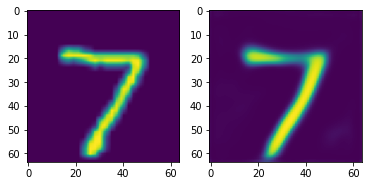

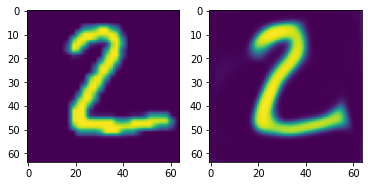

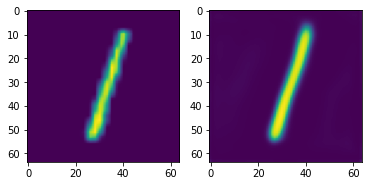

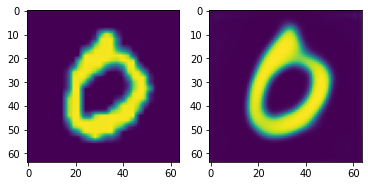

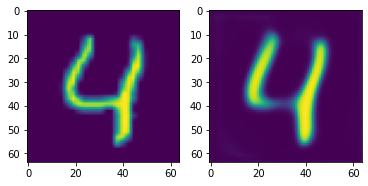

...

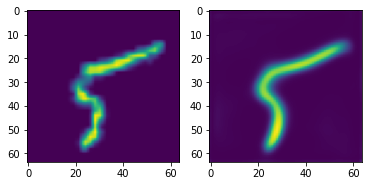

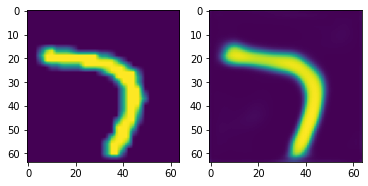

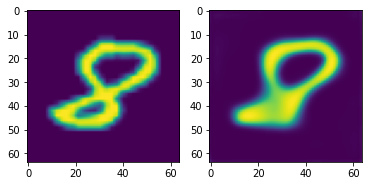

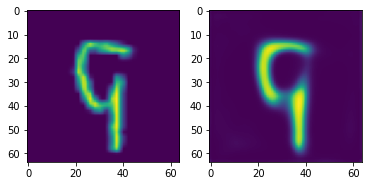

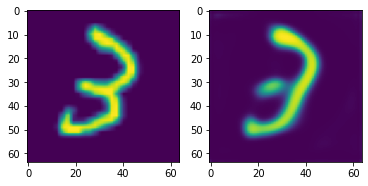

In [11]:
test_batch = next(iter(test_loader))
ae.eval()

for image in test_batch[0]:
    plt.subplot(1, 2, 1)
    plt.imshow(image.squeeze())
    plt.subplot(1, 2, 2)
    plt.imshow(ae(image.unsqueeze(0).to(device)).squeeze().detach().to('cpu'))
    plt.show()

### Denoising AE

In [12]:
class DenoisingBlock(nn.Module):
    def __init__(self, in_features, out_features, kernel, stride=1, bias=False, upsample=False):
        super().__init__()
        self.upsample = upsample
        self.conv = nn.Conv2d(in_features, out_features, kernel, stride=stride, padding=(kernel-1)//2, bias=bias)
        self.norm = nn.BatchNorm2d(out_features)
        self.act = nn.LeakyReLU(0.2)
        self.dropout = nn.Dropout(0.3)
        
    def forward(self, x):
        if self.upsample:
            x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False, recompute_scale_factor=False)
        x = x + torch.randn_like(x) * 0.05
        x = self.dropout(x)
        return self.act(self.norm(self.conv(x)))
        
class DenoisingAutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.encoder = nn.Sequential(
            DenoisingBlock(1, 16, 3, stride=2),
            DenoisingBlock(16, 32, 3, stride=2),
            DenoisingBlock(32, 32, 3, stride=2),
            DenoisingBlock(32, 32, 3, stride=2),
            DenoisingBlock(32, 32, 3, stride=1).conv,
        )
        
        self.decoder = nn.Sequential(
            DenoisingBlock(32, 32, 3, upsample=True),
            DenoisingBlock(32, 32, 3, upsample=True),
            DenoisingBlock(32, 32, 3, upsample=True),
            DenoisingBlock(32, 16, 3, upsample=True),
            DenoisingBlock(16, 1, 3).conv,
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        x = torch.sigmoid(x)
        return x
    
    def get_latent_features(self, x):
        return self.encoder(x)
    
def prepare_input(x):
    return x + torch.randn_like(x) * 0.1

In [13]:
dae = DenoisingAutoEncoder().to(device)
optim = torch.optim.Adam(dae.parameters(), lr=0.001)
criterion = nn.MSELoss()

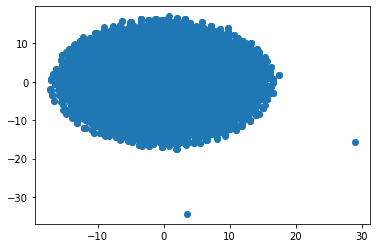

In [14]:
tsne = TSNE()
dae.eval()

latent_mnist = [
    dae.get_latent_features(x.to(device)).detach().to('cpu').view(batch_size, -1) for x, _ in tqdm(test_loader)
]
latent_mnist = torch.cat(latent_mnist, dim=0).numpy()
tsne_mnist = tsne.fit_transform(latent_mnist)
plt.scatter(tsne_mnist[:, 0], tsne_mnist[:, 1])
plt.show()


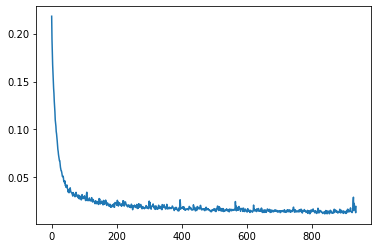

In [15]:
losses = []
dae.train()

for image, _ in tqdm(train_loader, desc='train loop', leave=True):
    optim.zero_grad()
    image = image.to(device)
    out = dae(prepare_input(image))
    loss = criterion(out, image)
    loss.backward()
    optim.step()
    losses.append(loss.item())
plt.plot(losses)
plt.show()

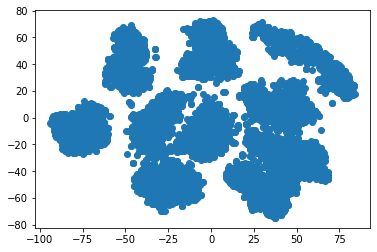

In [16]:
tsne = TSNE()
dae.eval()


latent_mnist = [
    dae.get_latent_features(x.to(device)).detach().to('cpu').view(batch_size, -1) for x, _ in tqdm(test_loader)
]
latent_mnist = torch.cat(latent_mnist, dim=0).numpy()
tsne_mnist = tsne.fit_transform(latent_mnist)

plt.scatter(tsne_mnist[:, 0], tsne_mnist[:, 1])
plt.show()

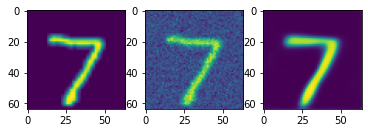

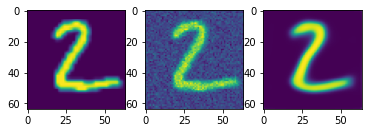

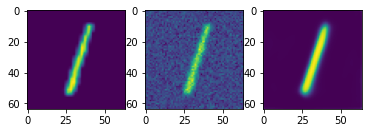

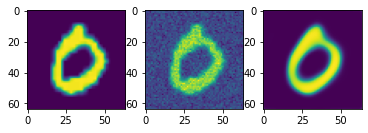

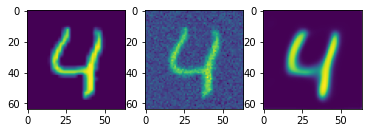

...

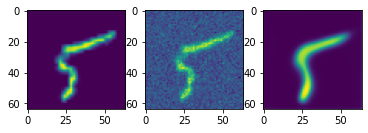

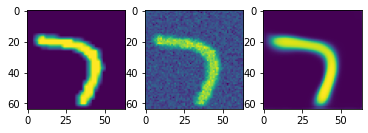

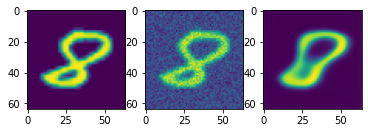

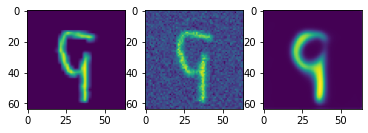

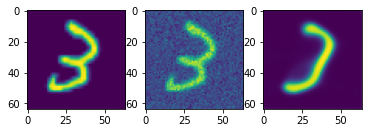

In [17]:
test_batch = next(iter(test_loader))
dae.eval()

for image in test_batch[0]:
    plt.subplot(1, 3, 1)
    plt.imshow(image.squeeze())
    plt.subplot(1, 3, 2)
    plt.imshow(prepare_input(image).squeeze())
    plt.subplot(1, 3, 3)
    plt.imshow(dae(image.unsqueeze(0).to(device)).squeeze().detach().to('cpu'))
    plt.show()

##### Denoising AE generation

In [18]:
test_batch = next(iter(test_loader))
test_images = test_batch[0].to(device)
dae.eval()

images_latent = dae.get_latent_features(test_images).to('cpu')

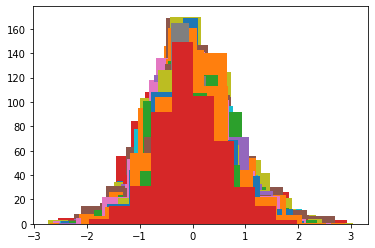

In [19]:
for l_image in images_latent:
    plt.hist(l_image.view(-1).detach())
plt.show()

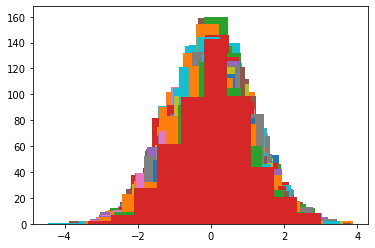

In [20]:
for l_image in images_latent:
    plt.hist(torch.randn_like(l_image).view(-1).detach())
plt.show()

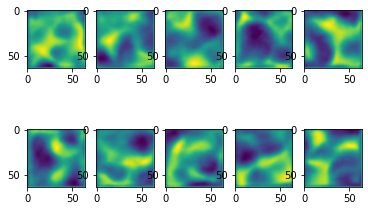

In [21]:
test_noise = torch.randn_like(images_latent) * 0.8
sampled_mnist = dae.decoder(test_noise.to(device)).to('cpu')
    

for ind in range(10):
    plt.subplot(2, 5, ind+1)
    plt.imshow(sampled_mnist[ind].squeeze().detach())


### Sparse AE

##### with KL regularization

In [22]:
class OldBlock(nn.Module):
    def __init__(self, in_features, out_features, kernel, stride=1, bias=False, upsample=False):
        super().__init__()
        self.upsample = upsample
        self.conv = nn.Conv2d(in_features, out_features, kernel, stride=stride, padding=(kernel-1)//2, bias=bias)
        self.act = nn.Sigmoid()
        
    def forward(self, x):
        if self.upsample:
            x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False, recompute_scale_factor=False)
        return self.act(self.conv(x))


class SparseAutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.encoder = nn.Sequential(
            OldBlock(1, 16, 3, stride=2),
            OldBlock(16, 32, 3, stride=2),
            OldBlock(32, 32, 3, stride=2),
            OldBlock(32, 32, 3, stride=2),
            OldBlock(32, 32, 3, stride=1).conv,
        )
        
        self.decoder = nn.Sequential(
            OldBlock(32, 32, 3, upsample=True),
            OldBlock(32, 32, 3, upsample=True),
            OldBlock(32, 32, 3, upsample=True),
            OldBlock(32, 16, 3, upsample=True),
            OldBlock(16, 1, 3).conv,
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        x = torch.sigmoid(x)
        return x
    
    def get_latent_features(self, x):
        return self.encoder(x)

In [23]:
sae = SparseAutoEncoder().to(device)
optim = torch.optim.Adam(sae.parameters(), lr=0.001)
criterion = nn.MSELoss()

In [24]:
FIXED_SPARSE_CONST = 0.05

def kl_divergence(x):
    x = x.view(x.shape[0], -1)
    # here we need the probability distributions
    # fortunately we already using sigmoid
    p_hat = torch.mean(x, dim=1)
    p = torch.ones_like(p_hat) * FIXED_SPARSE_CONST
    return torch.sum(p * torch.log(p/p_hat) + (1 - p) * torch.log((1 - p)/(1 - p_hat)))

def calculate_sparse_loss(sae, image):
    loss = 0
    x = image
    for block in sae.encoder[:-1]:
        x = block(x)
        loss += kl_divergence(x)
    x = sae.encoder[-1](x)
    # note that we are using sigmoid on each encoder layer except the last
    loss += kl_divergence(torch.sigmoid(x))
    
    for block in sae.decoder[:-1]:
        x = block(x)
        loss += kl_divergence(x)
    x = sae.decoder[-1](x)
    # note that we are using sigmoid on each decoder layer except the last
    loss += kl_divergence(torch.sigmoid(x))

    return loss


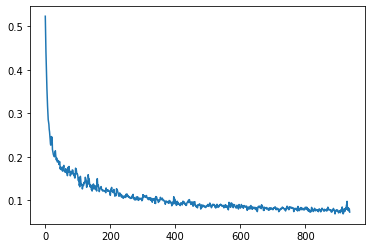

In [25]:
losses = []
sae.train()

for image, _ in tqdm(train_loader, desc='train loop', leave=True):
    optim.zero_grad()
    image = image.to(device)
    out = sae(image)
    loss = criterion(out, image) + 0.001 * calculate_sparse_loss(sae, image)
    loss.backward()
    optim.step()
    losses.append(loss.item())
plt.plot(losses)
plt.show()

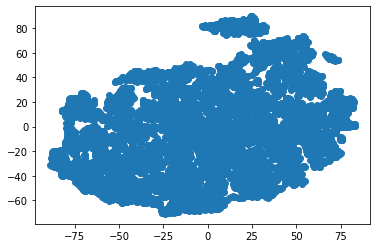

In [26]:
tsne = TSNE()
sae.eval()


latent_mnist = [
    sae.get_latent_features(x.to(device)).detach().to('cpu').view(batch_size, -1) for x, _ in tqdm(test_loader)
]
latent_mnist = torch.cat(latent_mnist, dim=0).numpy()
tsne_mnist = tsne.fit_transform(latent_mnist)

plt.scatter(tsne_mnist[:, 0], tsne_mnist[:, 1])
plt.show()

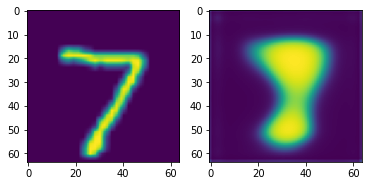

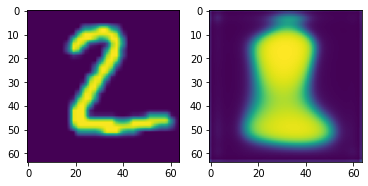

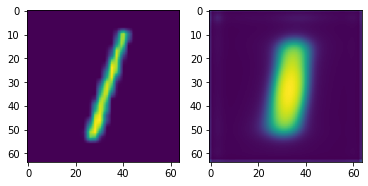

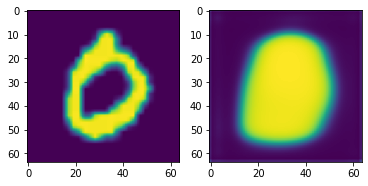

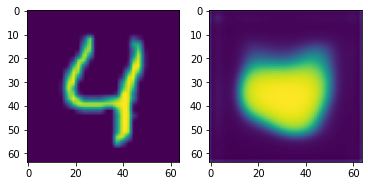

...

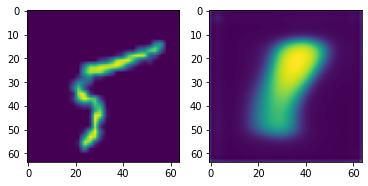

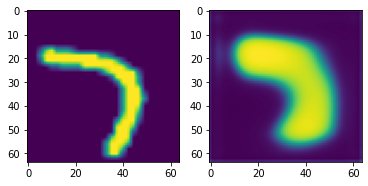

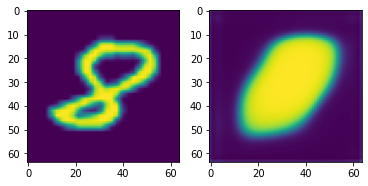

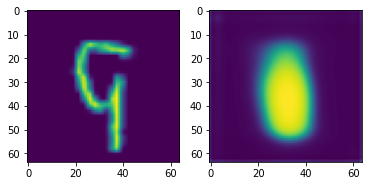

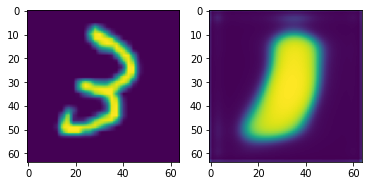

In [27]:
test_batch = next(iter(test_loader))
sae.eval()

for image in test_batch[0]:
    plt.subplot(1, 2, 1)
    plt.imshow(image.squeeze())
    plt.subplot(1, 2, 2)
    plt.imshow(sae(image.unsqueeze(0).to(device)).squeeze().detach().to('cpu'))
    plt.show()

In [28]:
test_batch = next(iter(test_loader))
test_images = test_batch[0].to(device)
sae.eval()

images_latent = sae.get_latent_features(test_images).to('cpu')

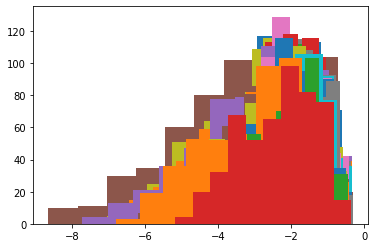

In [29]:
for l_image in images_latent:
    plt.hist(l_image.view(-1).detach())
plt.show()

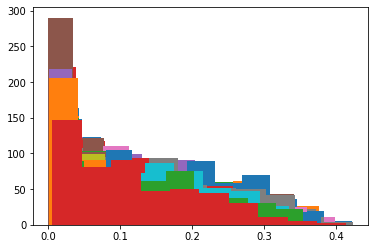

In [30]:
for l_image in images_latent:
    plt.hist(torch.sigmoid(l_image).view(-1).detach())
plt.show()

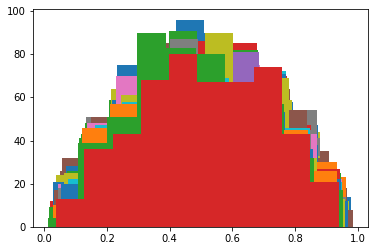

In [31]:
for l_image in images_latent:
    plt.hist(torch.sigmoid(torch.randn_like(l_image)).view(-1).detach())
plt.show()

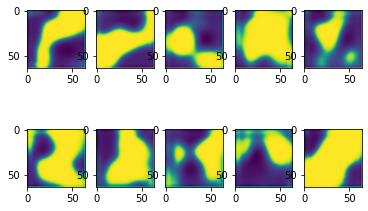

In [32]:
test_noise = (torch.randn_like(images_latent) * 10) - 5
sampled_mnist = sae.decoder(test_noise.to(device)).to('cpu')
    

for ind in range(10):
    plt.subplot(2, 5, ind+1)
    plt.imshow(sampled_mnist[ind].squeeze().detach())


### Sparse AE

##### with L1 regularization

In [33]:
class SparseAutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.encoder = nn.Sequential(
            Block(1, 16, 3, stride=2),
            Block(16, 32, 3, stride=2),
            Block(32, 32, 3, stride=2),
            Block(32, 32, 3, stride=2),
            Block(32, 32, 3, stride=1).conv,
        )
        
        self.decoder = nn.Sequential(
            Block(32, 32, 3, upsample=True),
            Block(32, 32, 3, upsample=True),
            Block(32, 32, 3, upsample=True),
            Block(32, 16, 3, upsample=True),
            Block(16, 1, 3).conv,
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        x = torch.sigmoid(x)
        return x
    
    def get_latent_features(self, x):
        return self.encoder(x)

In [34]:
sae = SparseAutoEncoder().to(device)
optim = torch.optim.Adam(sae.parameters(), lr=0.001)
criterion = nn.MSELoss()

In [35]:
def l1_loss(x):
    return torch.mean(torch.sum(torch.abs(x), dim=1))


def calculate_sparse_loss(sae, image):
    loss = 0
    x = image
    for block in sae.encoder[:-1]:
        x = block.conv(x)
        loss += l1_loss(x)
        x = block.act(block.norm(x))
    x = sae.encoder[-1](x)
    loss += l1_loss(x)

    for block in sae.decoder[:-1]:
        x = block.conv(x)
        loss += l1_loss(x)
        x = block.act(block.norm(x))
    x = sae.decoder[-1](x)
    loss += l1_loss(x)
    return loss


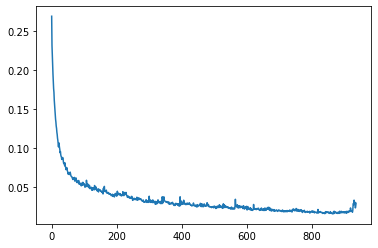

In [36]:
losses = []
sae.train()

for image, _ in tqdm(train_loader, desc='train loop', leave=True):
    optim.zero_grad()
    image = image.to(device)
    out = sae(image)
    loss = criterion(out, image) + 0.001 * calculate_sparse_loss(sae, image)
    loss.backward()
    optim.step()
    losses.append(loss.item())
plt.plot(losses)
plt.show()

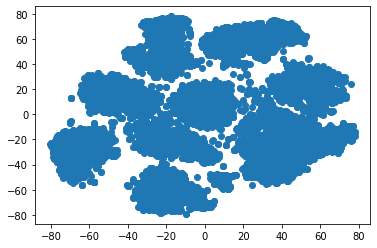

In [37]:
tsne = TSNE()
sae.eval()

latent_mnist = [
    sae.get_latent_features(x.to(device)).detach().to('cpu').view(batch_size, -1) for x, _ in tqdm(test_loader)
]
latent_mnist = torch.cat(latent_mnist, dim=0).numpy()
tsne_mnist = tsne.fit_transform(latent_mnist)

plt.scatter(tsne_mnist[:, 0], tsne_mnist[:, 1])
plt.show()

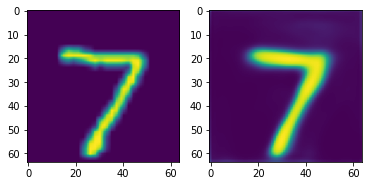

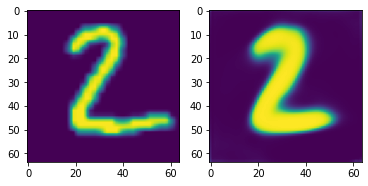

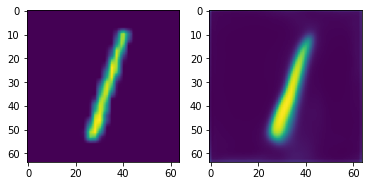

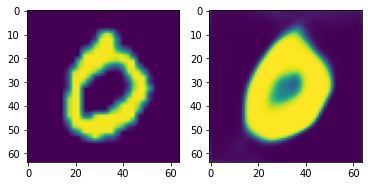

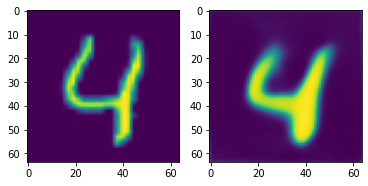

...

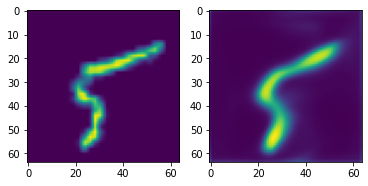

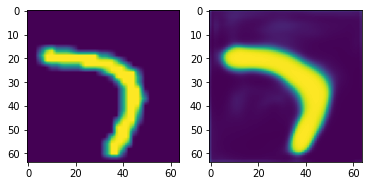

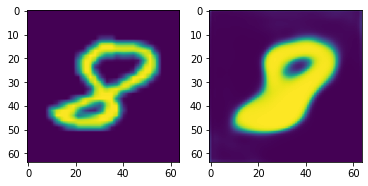

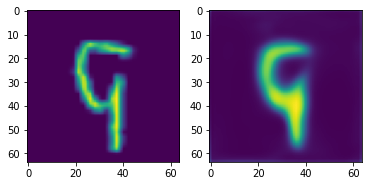

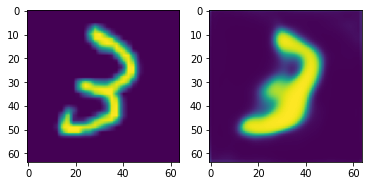

In [38]:
test_batch = next(iter(test_loader))
sae.eval()

for image in test_batch[0]:
    plt.subplot(1, 2, 1)
    plt.imshow(image.squeeze())
    plt.subplot(1, 2, 2)
    plt.imshow(sae(image.unsqueeze(0).to(device)).squeeze().detach().to('cpu'))
    plt.show()

In [39]:
test_batch = next(iter(test_loader))
test_images = test_batch[0].to(device)
sae.eval()

images_latent = sae.get_latent_features(test_images).to('cpu')

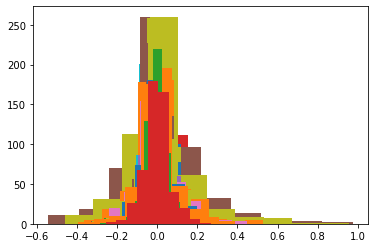

In [40]:
for l_image in images_latent:
    plt.hist(l_image.view(-1).detach())
plt.show()

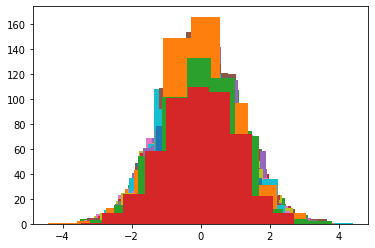

In [41]:
for l_image in images_latent:
    plt.hist(torch.randn_like(l_image).view(-1).detach())
plt.show()

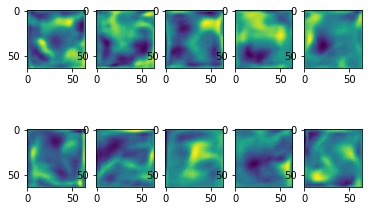

In [42]:
test_noise = torch.randn_like(images_latent) * 0.1
sampled_mnist = sae.decoder(test_noise.to(device)).to('cpu')
    

for ind in range(10):
    plt.subplot(2, 5, ind+1)
    plt.imshow(sampled_mnist[ind].squeeze().detach())
